In [1]:
import pandas as pd

# Load the CSV file
file_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
df = pd.read_csv(file_path, encoding='latin1')

# Display the first few rows of the dataset
print("First 5 rows of the dataset:")
print(df.head())
print("\n" + "="*50 + "\n")

# Display basic info about the dataset (data types, non-null counts)
print("Dataset Info:")
print(df.info())
print("\n" + "="*50 + "\n")

# Check for missing values (count of NaN per column)
print("Missing Values per Column:")
missing_values = df.isnull().sum()
print(missing_values)
print("\n" + "="*50 + "\n")

# Percentage of missing values per column
print("Percentage of Missing Values per Column:")
missing_percentage = (df.isnull().sum() / len(df)) * 100
print(missing_percentage.round(2))  # Rounded to 2 decimal places
print("\n" + "="*50 + "\n")

# Check column data types and unique value counts (to spot potential errors)
print("Column Data Types and Unique Values:")
for column in df.columns:
    print(f"Column: {column}")
    print(f"  Data Type: {df[column].dtype}")
    print(f"  Unique Values: {df[column].nunique()}")
    # Display sample values (first 5 unique values) to inspect for errors
    print(f"  Sample Values: {df[column].dropna().unique()[:5]}")
    print("-"*30)

First 5 rows of the dataset:
   device  hive number            date  hive temp  hive humidity  \
0       1            5  6/8/2022 14:52      36.42          30.29   
1       1            5  6/8/2022 15:51      33.56          33.98   
2       1            5  6/8/2022 17:21      29.01          42.73   
3       1            5  6/8/2022 18:20      30.51          36.74   
4       1            5  6/8/2022 19:20      30.32          35.55   

   hive pressure  weather temp  weather humidity  weather pressure  \
0        1007.45         26.68                52              1013   
1        1006.93         25.99                53              1012   
2        1006.68         24.49                56              1012   
3        1006.68         22.97                59              1012   
4        1006.58         21.52                61              1012   

   wind speed  ...  cloud coverage  rain    lat    long  \
0        8.75  ...              75     0  37.29 -121.95   
1       10.29  ...     

Correlation Matrix:
                    device  hive number  hive temp  hive humidity  \
device            1.000000    -0.880512  -0.097078      -0.602092   
hive number      -0.880512     1.000000   0.073052       0.512342   
hive temp        -0.097078     0.073052   1.000000      -0.443980   
hive humidity    -0.602092     0.512342  -0.443980       1.000000   
hive pressure    -0.191270     0.039504  -0.049095       0.295588   
weather temp     -0.017296     0.038369   0.695017      -0.545912   
weather humidity -0.008896    -0.042427  -0.625322       0.606318   
weather pressure -0.026170     0.007744   0.035342       0.057181   
wind speed        0.030273     0.002332   0.227437      -0.279870   
gust speed        0.089327    -0.079746   0.250878      -0.353739   
weatherID        -0.010034    -0.004639   0.010876       0.062030   
cloud coverage   -0.008815     0.029422  -0.046611       0.141785   
queen presence    0.036459    -0.068747  -0.048350       0.026062   
queen acceptan

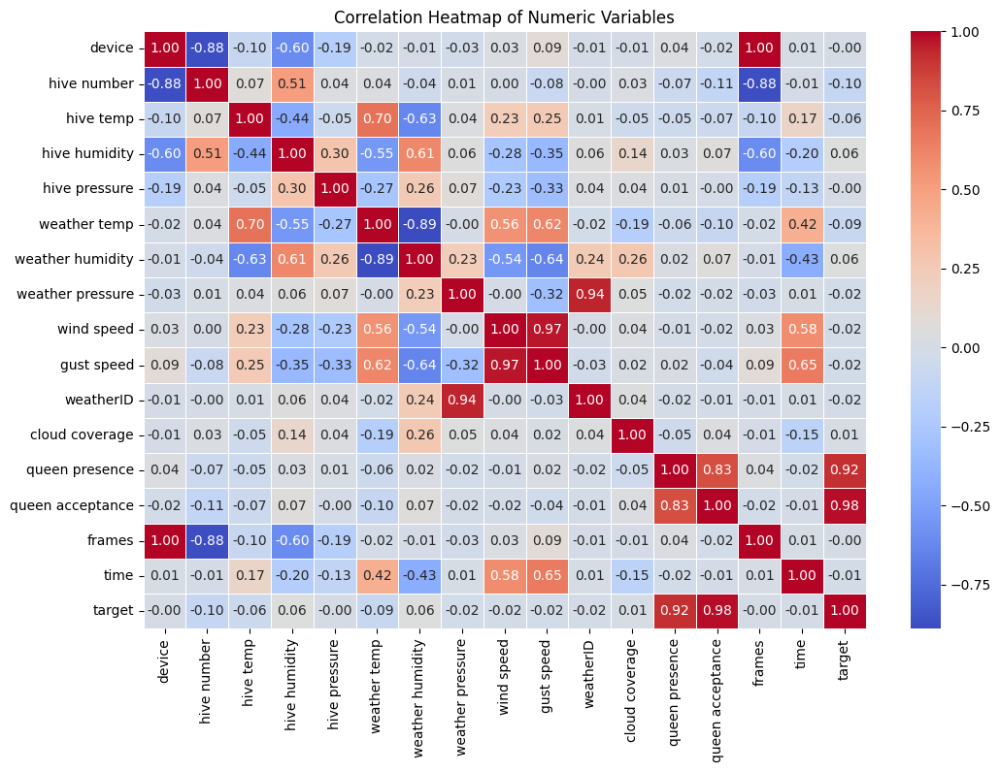

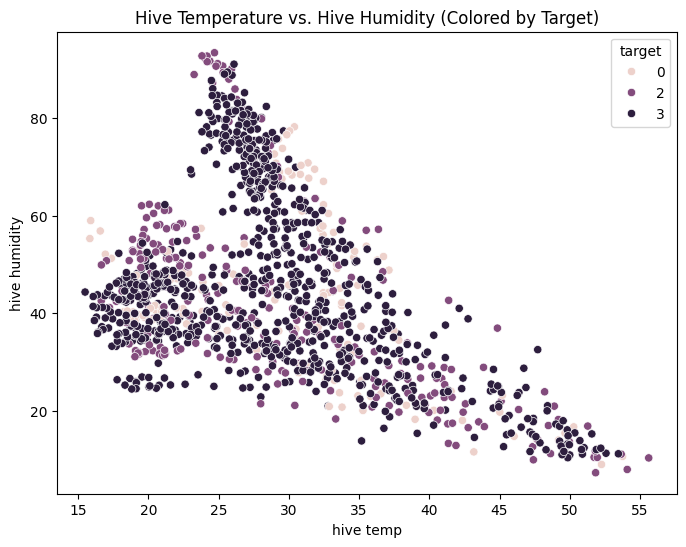

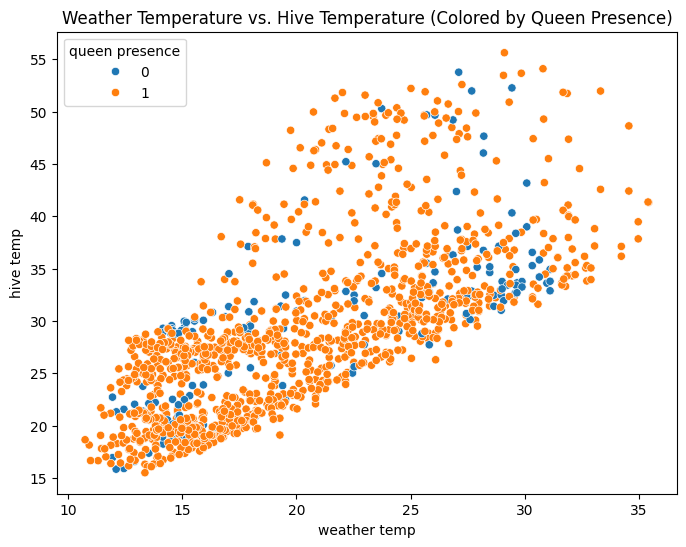

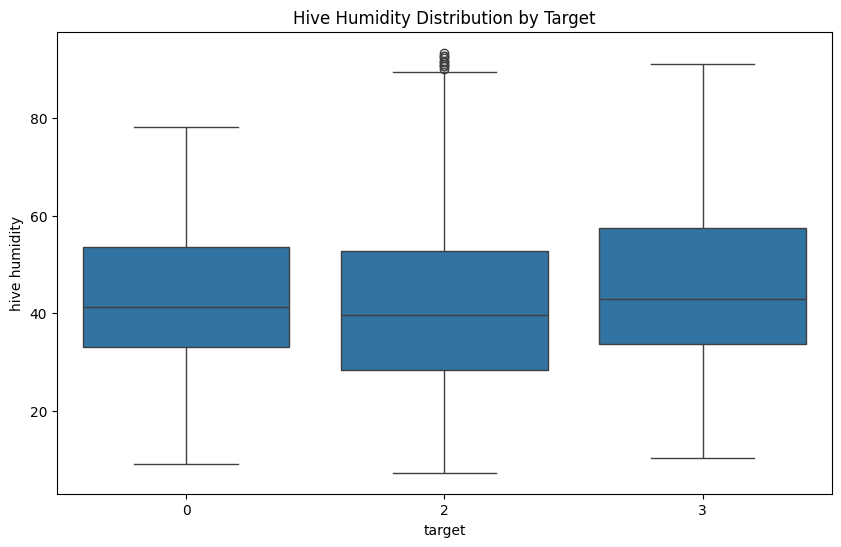

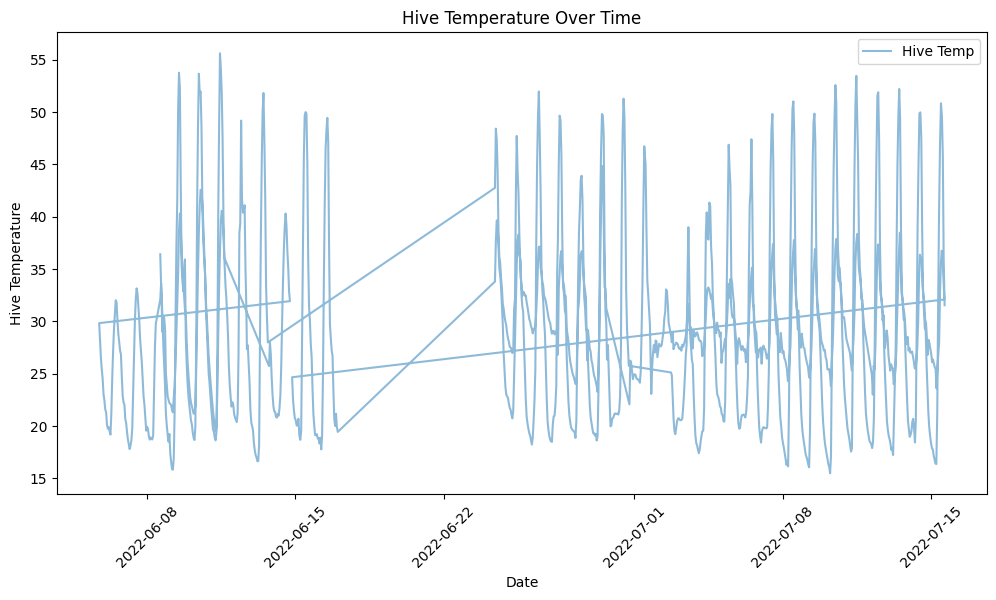

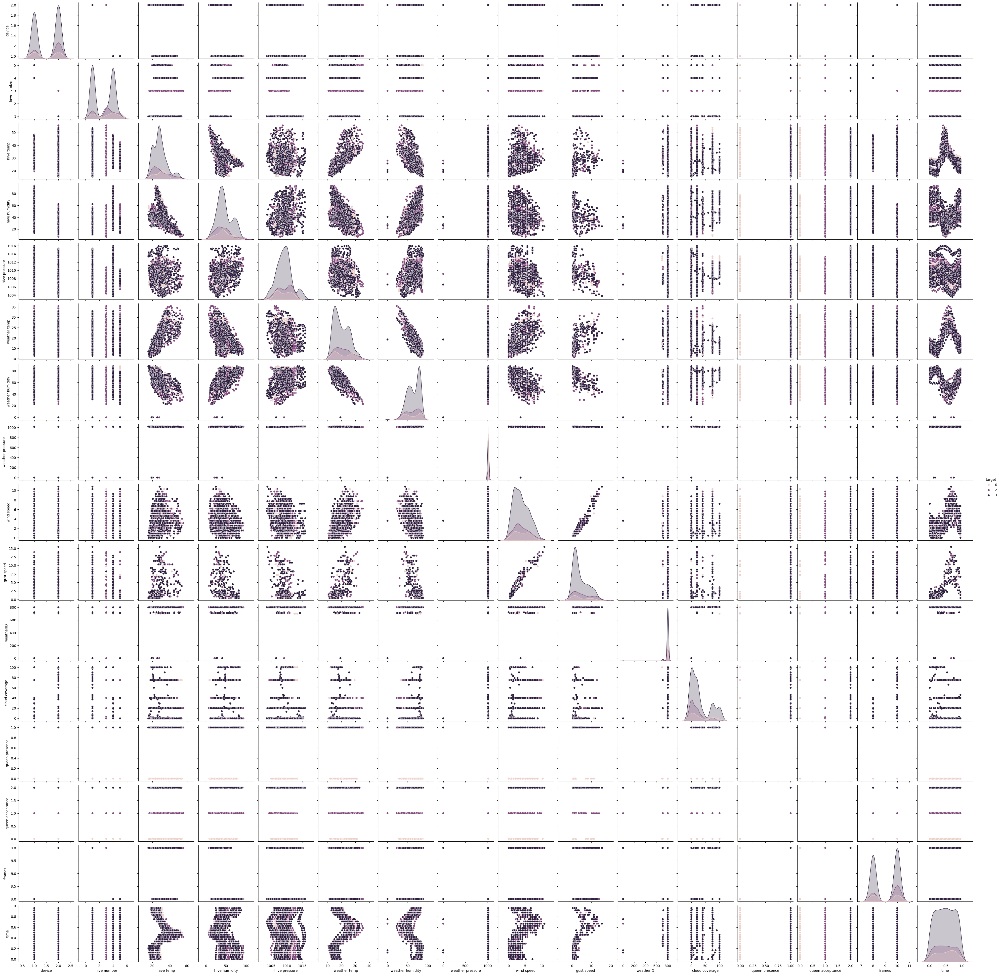

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and clean the dataset (from previous step)
file_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
df = pd.read_csv(file_path, encoding='latin1')
columns_to_drop = ['lat', 'long', 'rain']
df = df.drop(columns=columns_to_drop)
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y %H:%M')
df['weather temp'] = df['weather temp'].fillna(df['weather temp'].median())
df['wind speed'] = df['wind speed'].fillna(df['wind speed'].median())



# 1. Correlation Matrix for Numeric Columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numeric_cols].corr()

# Display the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Visualize with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Variables")
plt.show()

# 2. Scatter Plots for Key Numeric Pairs
# Example: Hive Temp vs. Hive Humidity
plt.figure(figsize=(8, 6))
sns.scatterplot(x='hive temp', y='hive humidity', hue='target', data=df)
plt.title("Hive Temperature vs. Hive Humidity (Colored by Target)")
plt.show()

# Example: Weather Temp vs. Hive Temp
plt.figure(figsize=(8, 6))
sns.scatterplot(x='weather temp', y='hive temp', hue='queen presence', data=df)
plt.title("Weather Temperature vs. Hive Temperature (Colored by Queen Presence)")
plt.show()

# Example: Hive Humidity across Target
plt.figure(figsize=(10, 6))
sns.boxplot(x='target', y='hive humidity', data=df)
plt.title("Hive Humidity Distribution by Target")
plt.show()

# 4. Time-Based Trends
# Example: Hive Temp over Time
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['hive temp'], label='Hive Temp', alpha=0.5)
plt.xlabel("Date")
plt.ylabel("Hive Temperature")
plt.title("Hive Temperature Over Time")
plt.legend()
plt.xticks(rotation=45)
plt.show()

# 5. Optional: Pairplot for a broader overview (can be slow with large datasets)
# Uncomment if you want to explore all numeric pairs
sns.pairplot(df[numeric_cols], hue='target')
plt.show()

Missing Values Before Analysis:
device              0
hive number         0
hive temp           0
hive humidity       0
hive pressure       0
weather temp        0
weather humidity    0
weather pressure    0
wind speed          0
gust speed          0
weatherID           0
cloud coverage      0
queen presence      0
queen acceptance    0
frames              0
time                0
hour                0
day                 0
dtype: int64

Correlation with Target (Absolute Values):
queen acceptance    0.982543
queen presence      0.917636
hive number         0.104093
weather temp        0.086674
hive temp           0.062641
weather humidity    0.055203
hive humidity       0.055002
weather pressure    0.019978
wind speed          0.015458
weatherID           0.015401
time                0.014477
gust speed          0.012713
cloud coverage      0.009091
device              0.002452
frames              0.002452
hive pressure       0.000157
dtype: float64


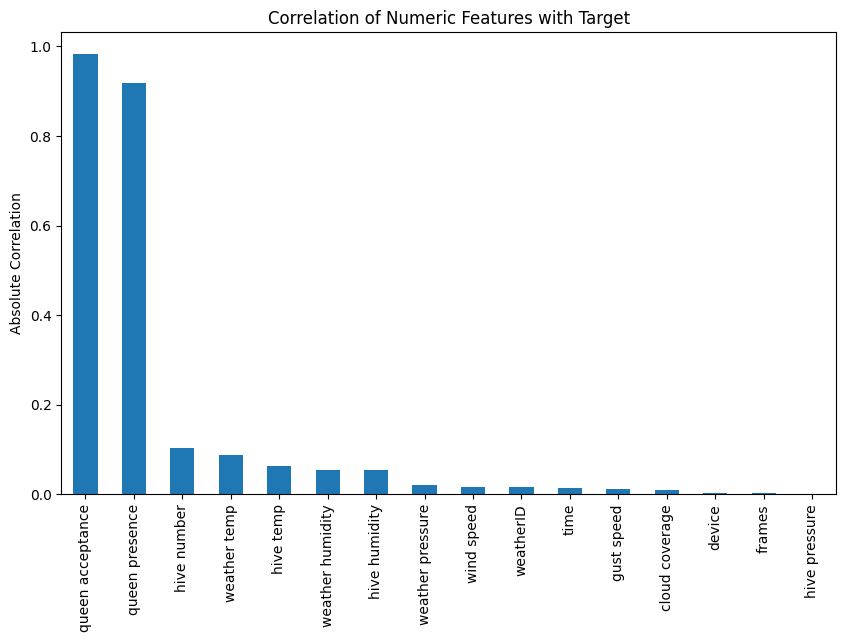


Feature Importance from Random Forest:
queen acceptance    0.622946
queen presence      0.225228
hive number         0.022365
weather pressure    0.020339
hive pressure       0.019860
hive humidity       0.017862
weather temp        0.014589
weather humidity    0.012493
weatherID           0.010981
cloud coverage      0.009039
hive temp           0.007920
wind speed          0.005592
device              0.003756
time                0.002676
gust speed          0.002507
frames              0.001846
dtype: float64


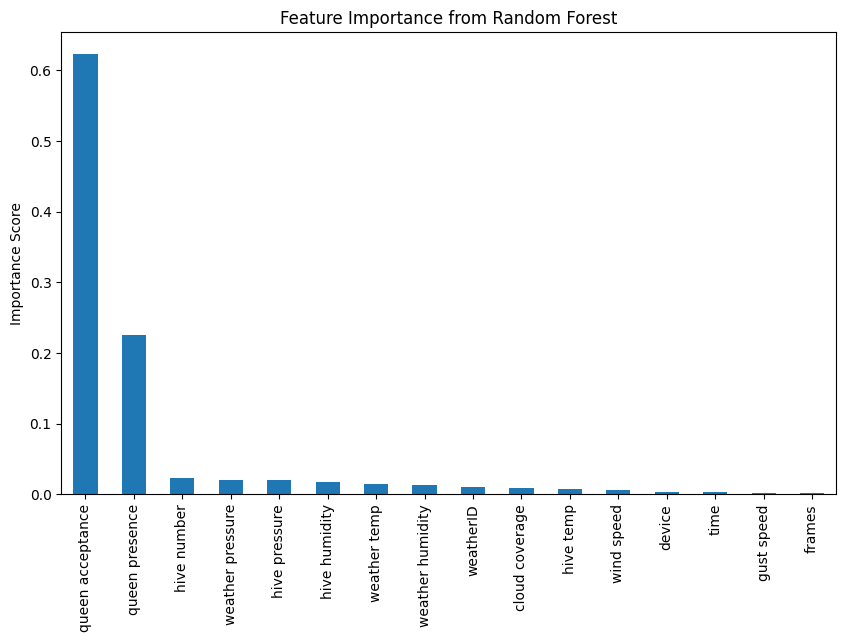

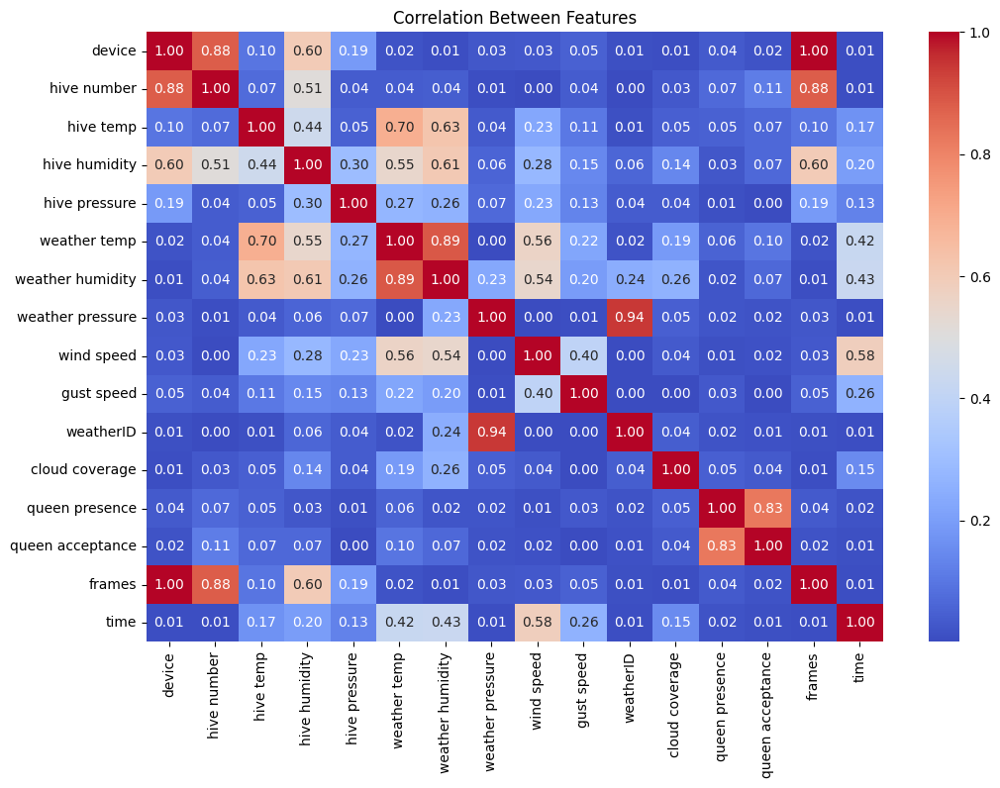


Highly Correlated Feature Pairs (>0.8):
hive number - device: 0.88
weather humidity - weather temp: 0.89
weatherID - weather pressure: 0.94
queen acceptance - queen presence: 0.83
frames - device: 1.00
frames - hive number: 0.88

Top Features from SelectKBest (f_classif):
queen presence            inf
queen acceptance          inf
cloud coverage      13.056462
hive number          9.930020
weather temp         7.151445
device               6.095189
frames               6.095189
weather humidity     5.170348
hive humidity        4.352990
hive temp            2.843965
dtype: float64

Final Selected Features:
['hive number', 'hive temp', 'queen presence', 'hive humidity', 'queen acceptance', 'device', 'weather pressure', 'hive pressure', 'weather temp']

Shape of Final Feature Set: (1275, 9)


d:\Anaconda 3\envs\installingrasa\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: divide by zero encountered in divide
  f = msb / msw


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif

# Load and clean the dataset
file_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
df = pd.read_csv(file_path, encoding='latin1')
columns_to_drop = ['lat', 'long', 'rain']
df = df.drop(columns=columns_to_drop)
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y %H:%M')

# Impute missing values for ALL numeric columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
for col in numeric_cols:
    df[col] = df[col].fillna(df[col].median())

# Extract features from date
df['hour'] = df['date'].dt.hour
df['day'] = df['date'].dt.day

# Define target and features
target = 'target'  # Change to 'queen status' if needed
X = df.drop(columns=[target, 'date', 'file name'])  # Drop non-numeric/unique columns
y = df[target]

# Verify no NaN values remain
print("Missing Values Before Analysis:")
print(X.isnull().sum())
assert X.isnull().sum().sum() == 0, "There are still NaN values in X!"

# 1. Correlation with Target (Numeric Features)
numeric_cols = X.select_dtypes(include=['float64', 'int64']).columns
corr_with_target = X[numeric_cols].corrwith(y).abs().sort_values(ascending=False)
print("\nCorrelation with Target (Absolute Values):")
print(corr_with_target)

# Visualize correlation
plt.figure(figsize=(10, 6))
corr_with_target.plot(kind='bar')
plt.title("Correlation of Numeric Features with Target")
plt.ylabel("Absolute Correlation")
plt.show()

# 2. Feature Importance with Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X[numeric_cols], y)
importances = pd.Series(rf.feature_importances_, index=numeric_cols).sort_values(ascending=False)
print("\nFeature Importance from Random Forest:")
print(importances)

# Visualize feature importance
plt.figure(figsize=(10, 6))
importances.plot(kind='bar')
plt.title("Feature Importance from Random Forest")
plt.ylabel("Importance Score")
plt.show()

# 3. Check Redundancy (Correlation Between Features)
corr_matrix = X[numeric_cols].corr().abs()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Between Features")
plt.show()

# Identify highly correlated pairs (>0.8)
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr_pairs = [(col, row, corr_matrix.loc[row, col]) 
                   for col in upper_tri.columns 
                   for row in upper_tri.index 
                   if upper_tri.loc[row, col] > 0.8]
print("\nHighly Correlated Feature Pairs (>0.8):")
for pair in high_corr_pairs:
    print(f"{pair[0]} - {pair[1]}: {pair[2]:.2f}")

# 4. Select Top Features with SelectKBest
selector = SelectKBest(score_func=f_classif, k=10)  # Top 10 features
X_selected = selector.fit_transform(X[numeric_cols], y)
selected_indices = selector.get_support(indices=True)
selected_features = numeric_cols[selected_indices]
scores = pd.Series(selector.scores_, index=numeric_cols).sort_values(ascending=False)
print("\nTop Features from SelectKBest (f_classif):")
print(scores.head(10))

# Combine insights to pick final features
final_features = list(set(corr_with_target.head(5).index) | 
                      set(importances.head(5).index) | 
                      set(selected_features[:5]))
print("\nFinal Selected Features:")
print(final_features)

# Create a new dataset with selected features
X_final = X[final_features]
print("\nShape of Final Feature Set:", X_final.shape)

In [10]:
import os
import pandas as pd

# Define paths
dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
audio_folder = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files"
cleaned_dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\cleaned_dataset.xlsx"

# Load dataset
df = pd.read_csv(dataset_path)

# Strip spaces and ensure uniform casing
df["file name"] = df["file name"].str.strip().str.lower()
print(df["file name"])
# Get list of actual files in the folder (without extensions)
existing_files = {f.lower().rsplit(".", 1)[0] for f in os.listdir(audio_folder) if f.endswith(".wav")}

# Debugging: Print first few filenames from dataset and directory
print("First 5 filenames from dataset:", df["file name"].head().tolist())
print("First 5 filenames from directory:", list(existing_files)[:5])

# Function to check if file exists in the directory
def file_exists(file_name):
    return file_name in existing_files

# Filter dataset
df_filtered = df[df["file name"].apply(file_exists)].reset_index(drop=True)

# Save filtered dataset
df_filtered.to_excel(cleaned_dataset_path, index=False)

print(f"Filtered dataset saved. Rows remaining: {len(df_filtered)}")


0       2022-06-08--14-52-28_1.raw
1       2022-06-08--15-51-41_1.raw
2       2022-06-08--17-21-53_1.raw
3       2022-06-08--18-20-59_1.raw
4       2022-06-08--19-20-04_1.raw
                   ...            
1270    2022-07-15--11-18-39_2.raw
1271    2022-07-15--12-25-14_2.raw
1272    2022-07-15--13-25-58_2.raw
1273    2022-07-15--14-24-58_2.raw
1274    2022-07-15--15-28-21_2.raw
Name: file name, Length: 1275, dtype: object
First 5 filenames from dataset: ['2022-06-08--14-52-28_1.raw', '2022-06-08--15-51-41_1.raw', '2022-06-08--17-21-53_1.raw', '2022-06-08--18-20-59_1.raw', '2022-06-08--19-20-04_1.raw']
First 5 filenames from directory: ['2022-06-10--07-39-02_1__segment1', '2022-06-07--22-58-20_2__segment1', '2022-07-08--00-56-41_1__segment1', '2022-07-11--08-19-41_1__segment0', '2022-07-07--16-17-49_2__segment1']


PermissionError: [Errno 13] Permission denied: 'D:\\AIDS\\3rd year\\sem2\\Bee Hive Condition Projecct\\archive\\cleaned_dataset.xlsx'

In [21]:
import os
import pandas as pd

# Define paths
dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
audio_folder = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files"
cleaned_dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\cleaned_dataset.xlsx"

# Load the dataset
df = pd.read_csv(dataset_path)

# Function to check if file exists
def file_exists(file_name):
    print(file_name)
    for ext in ['.raw', '.wav']:  # Checking both possible extensions
        print(audio_folder, file_name + ext)
        if os.path.exists(os.path.join(audio_folder, file_name + ext)):
            return True
    return False

# Filter dataset to only include rows where the file exists
df_filtered = df[df['file name'].apply(file_exists)].reset_index(drop=True)

# Save the cleaned dataset
df_filtered.to_excel(cleaned_dataset_path, index=False)

print(f"Filtered dataset saved to: {cleaned_dataset_path}")


2022-06-08--14-52-28_1.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--14-52-28_1.raw.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--14-52-28_1.raw.wav
2022-06-08--15-51-41_1.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--15-51-41_1.raw.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--15-51-41_1.raw.wav
2022-06-08--17-21-53_1.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--17-21-53_1.raw.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--17-21-53_1.raw.wav
2022-06-08--18-20-59_1.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--18-20-59_1.raw.raw
D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files 2022-06-08--18-20-5

In [20]:
import os

# Define the folder path
audio_folder = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files"

# Get a list of all files in the directory
file_list = os.listdir(audio_folder)

# Extract unique parts before "__"
unique_parts = set(file.split("__")[0] for file in file_list)
print(len(unique_parts))
# Print unique extracted parts
print("Unique extracted parts:")
for part in unique_parts:
    print(part)


1222
Unique extracted parts:
2022-07-03--02-17-15_1
2022-06-12--07-32-30_2
2022-06-16--06-14-12_2
2022-06-07--10-09-14_2
2022-06-14--00-02-46_1
2022-06-27--19-25-25_1
2022-07-15--01-20-58_1
2022-06-30--10-46-15_2
2022-06-30--23-19-59_1
2022-07-07--08-05-44_1
2022-07-15--02-05-35_2
2022-07-07--05-24-42_2
2022-07-09--11-58-41_2
2022-07-13--09-02-04_2
2022-06-09--18-49-20_2
2022-07-14--20-19-58_1
2022-06-09--17-03-35_1
2022-06-26--05-51-52_1
2022-06-07--21-59-10_2
2022-06-08--17-21-53_1
2022-06-12--00-37-49_2
2022-06-12--04-34-37_2
2022-06-27--13-17-43_2
2022-06-11--15-28-56_2
2022-06-27--12-18-31_2
2022-07-14--09-52-14_2
2022-07-10--01-43-36_1
2022-07-12--06-05-44_1
2022-06-27--00-36-44_2
2022-07-01--12-42-18_1
2022-07-10--13-37-42_1
2022-06-05--19-39-14_2
2022-06-28--05-16-54_1
2022-07-11--20-19-03_2
2022-07-03--23-06-41_2
2022-06-26--00-55-53_2
2022-07-15--15-12-01_1
2022-07-08--08-50-34_1
2022-07-03--05-16-49_2
2022-06-10--19-43-44_1
2022-07-04--20-46-42_1
2022-07-12--05-21-31_2
2022-

In [1]:
import os
import pandas as pd

# Define paths
dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\all_data_updated1.csv"
audio_folder = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\sound_files\sound_files"
cleaned_dataset_path = r"D:\AIDS\3rd year\sem2\Bee Hive Condition Projecct\archive\cleaned_dataset.xlsx"

# Load the dataset
df = pd.read_csv(dataset_path)

# Extract unique parts before "__" from filenames in the folder
unique_parts = {file.split("__")[0] + ".raw" for file in os.listdir(audio_folder)}

print(f"Unique extracted parts count: {len(unique_parts)}")

# Debug: Print first few unique file names
print("First 10 unique extracted file names:", list(unique_parts)[:10])

# Filter dataset to keep only rows where 'file name' exists in unique_parts
df_filtered = df[df["file name"].isin(unique_parts)].reset_index(drop=True)

# Save the cleaned dataset
df_filtered.to_excel(cleaned_dataset_path, index=False)

print(f"Filtered dataset saved. Rows remaining: {len(df_filtered)}")


Unique extracted parts count: 1222
First 10 unique extracted file names: ['2022-07-13--02-51-31_1.raw', '2022-07-03--12-09-31_1.raw', '2022-07-06--22-26-45_2.raw', '2022-07-08--14-46-25_1.raw', '2022-07-14--09-52-14_2.raw', '2022-07-10--19-52-11_1.raw', '2022-07-02--23-21-36_2.raw', '2022-07-05--02-55-46_2.raw', '2022-07-03--20-09-13_2.raw', '2022-07-07--01-08-35_1.raw']
Filtered dataset saved. Rows remaining: 1222


Correlation Matrix:
                    device  hive number  hive temp  hive humidity  \
device            1.000000    -0.876584  -0.096499      -0.601004   
hive number      -0.876584     1.000000   0.071775       0.508629   
hive temp        -0.096499     0.071775   1.000000      -0.445981   
hive humidity    -0.601004     0.508629  -0.445981       1.000000   
hive pressure    -0.198288     0.036486  -0.051697       0.299558   
weather temp     -0.009143     0.032381   0.698969      -0.546479   
weather humidity -0.008874    -0.045566  -0.643309       0.609682   
weather pressure -0.001680    -0.035028   0.006188       0.057155   
wind speed        0.037594    -0.006815   0.227502      -0.276082   
gust speed        0.095449    -0.092724   0.248631      -0.352619   
weatherID         0.015157    -0.044532  -0.024044       0.062480   
cloud coverage   -0.005137     0.024446  -0.043918       0.133696   
queen presence    0.039531    -0.068455  -0.049843       0.024321   
queen acceptan

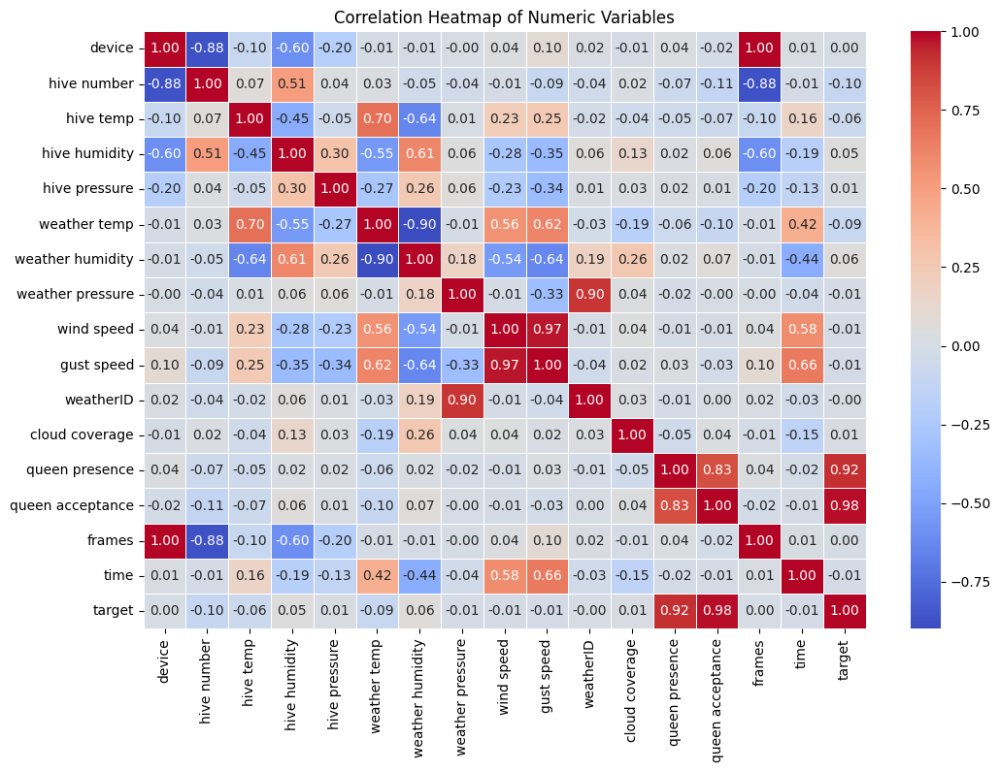

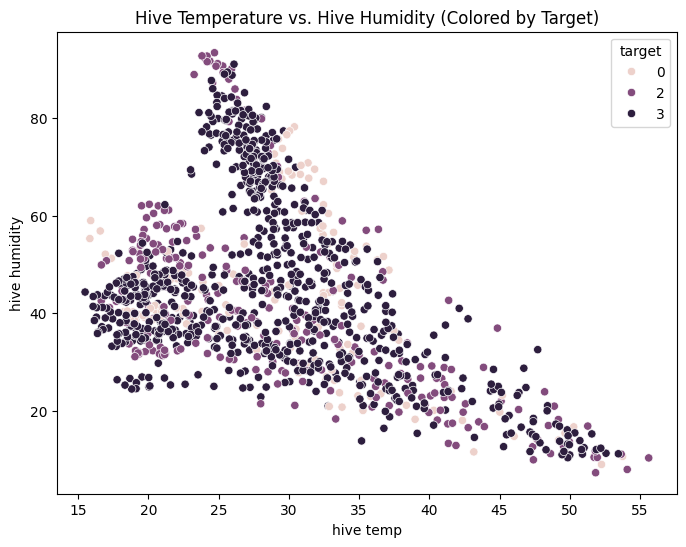

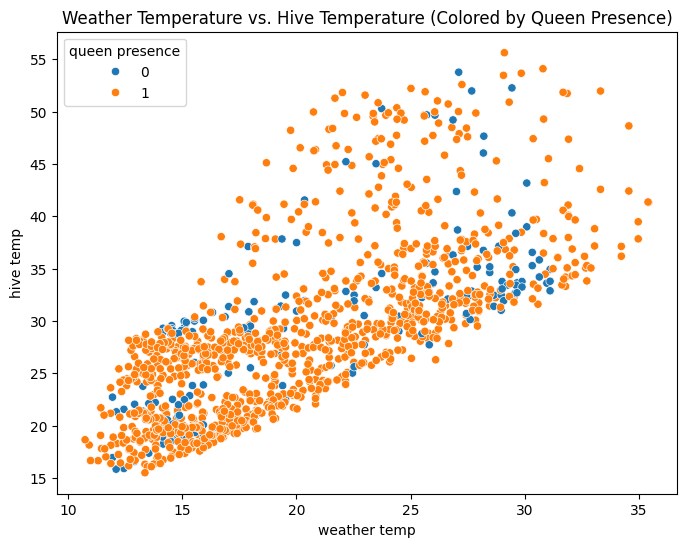

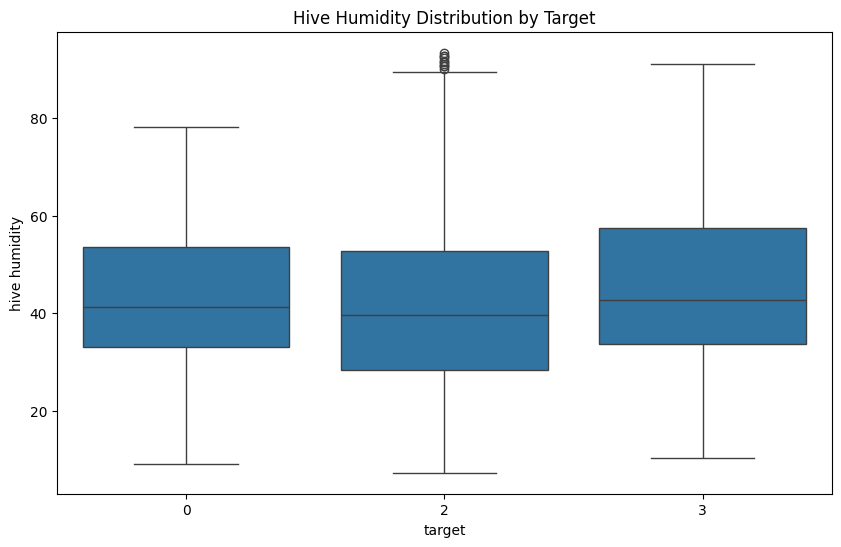

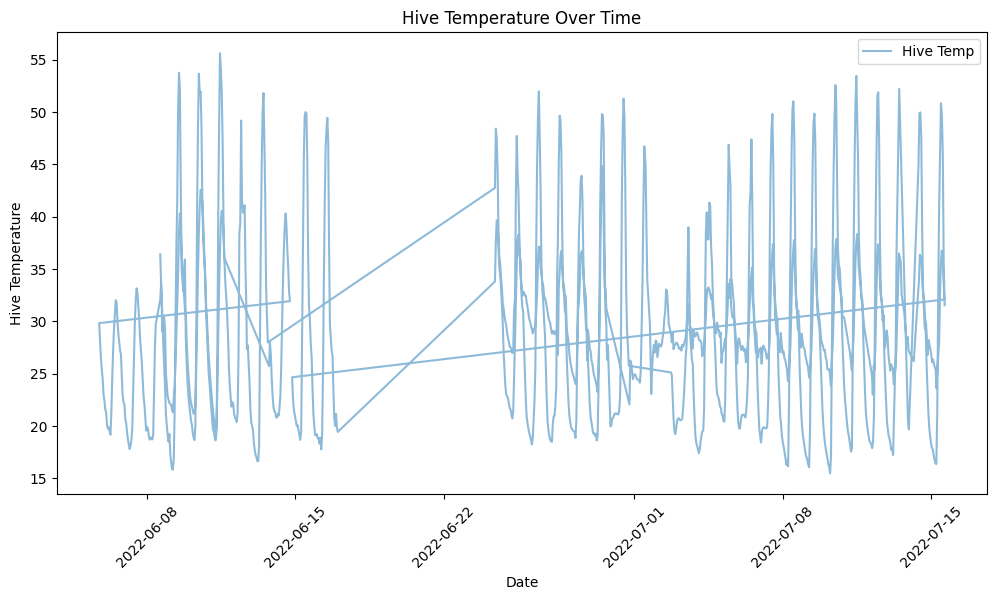

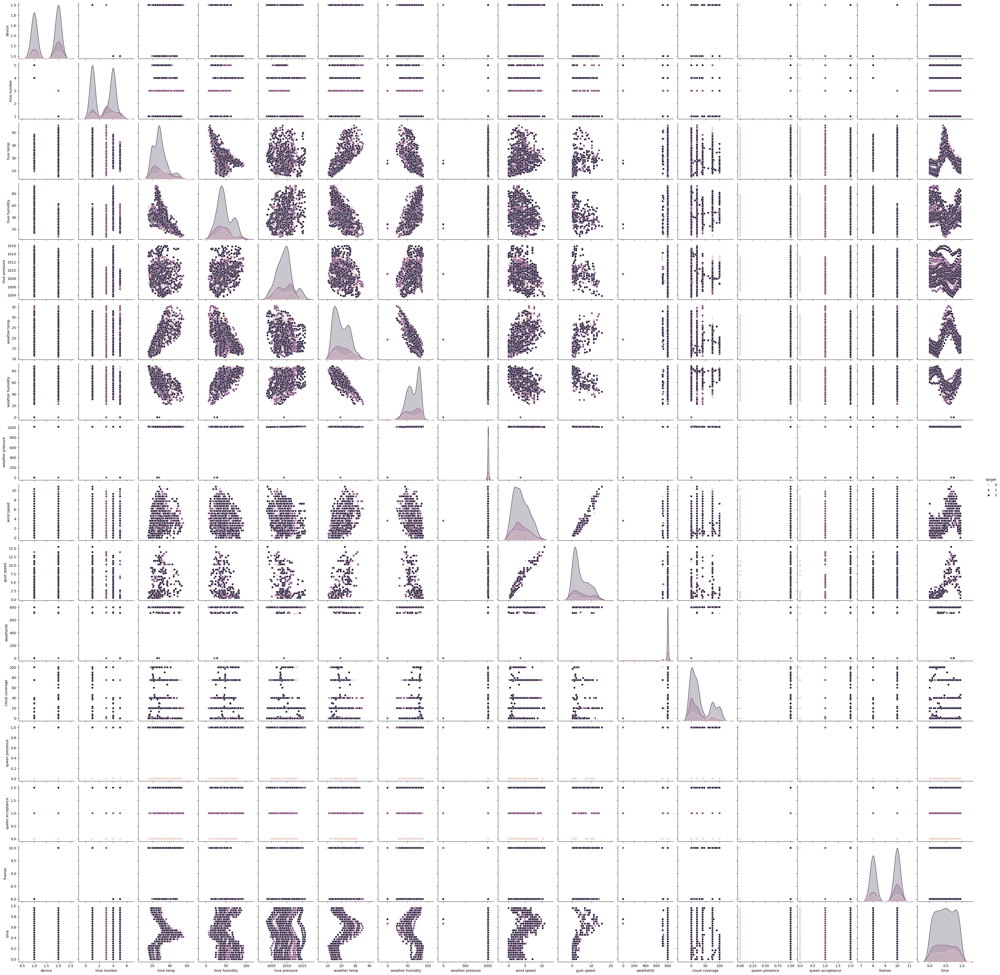

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load and clean the dataset (from previous step)
file_path = cleaned_dataset_path
df = pd.read_excel(file_path)
columns_to_drop = ['lat', 'long', 'rain']
df = df.drop(columns=columns_to_drop)
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y %H:%M')
df['weather temp'] = df['weather temp'].fillna(df['weather temp'].median())
df['wind speed'] = df['wind speed'].fillna(df['wind speed'].median())



# 1. Correlation Matrix for Numeric Columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numeric_cols].corr()

# Display the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Visualize with a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Variables")
plt.show()

# 2. Scatter Plots for Key Numeric Pairs
# Example: Hive Temp vs. Hive Humidity
plt.figure(figsize=(8, 6))
sns.scatterplot(x='hive temp', y='hive humidity', hue='target', data=df)
plt.title("Hive Temperature vs. Hive Humidity (Colored by Target)")
plt.show()

# Example: Weather Temp vs. Hive Temp
plt.figure(figsize=(8, 6))
sns.scatterplot(x='weather temp', y='hive temp', hue='queen presence', data=df)
plt.title("Weather Temperature vs. Hive Temperature (Colored by Queen Presence)")
plt.show()

# Example: Hive Humidity across Target
plt.figure(figsize=(10, 6))
sns.boxplot(x='target', y='hive humidity', data=df)
plt.title("Hive Humidity Distribution by Target")
plt.show()

# 4. Time-Based Trends
# Example: Hive Temp over Time
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['hive temp'], label='Hive Temp', alpha=0.5)
plt.xlabel("Date")
plt.ylabel("Hive Temperature")
plt.title("Hive Temperature Over Time")
plt.legend()
plt.xticks(rotation=45)
plt.show()

# 5. Optional: Pairplot for a broader overview (can be slow with large datasets)
# Uncomment if you want to explore all numeric pairs
sns.pairplot(df[numeric_cols], hue='target')
plt.show()